In [1]:
import os
import wfdb
import numpy as np
from scipy.signal import butter, filtfilt
import matplotlib.pyplot as plt

# Define the path where your MIT-BIH dataset is stored
data_path = '/home/researchgroup/mahjabeen_workspace/research/CLINet-ECG-Classification-2024/data/mit-bih/mitbih_database/'

# Define the path where you want to save the processed signals
processed_data_path = './save_processed_signals'
os.makedirs(processed_data_path, exist_ok=True)

# List of all records in the dataset
record_list = ['100', '101', '102', '103', '104', '105', '106', '107', '108', '109',
               '111', '112', '113', '114', '115', '116', '117', '118', '119', '121',
               '122', '123', '124', '200', '201', '202', '203', '205', '207', '208',
               '209', '210', '212', '213', '214', '215', '217', '219', '220', '221',
               '222', '223', '228', '230', '231', '232', '233', '234']

# Function to apply bandpass filter
def bandpass_filter(signal, lowcut=0.5, highcut=50.0, fs=360, order=5):
    nyquist = 0.5 * fs
    low = lowcut / nyquist
    high = highcut / nyquist
    b, a = butter(order, [low, high], btype='band')
    return filtfilt(b, a, signal)

# Iterate over all records
for record_name in record_list:
    print(f'Processing record: {record_name}')
    
    # Load record and annotations
    record = wfdb.rdrecord(os.path.join(data_path, record_name))
    annotation = wfdb.rdann(os.path.join(data_path, record_name), 'atr')
    
    # Get the ECG signal and apply bandpass filter
    ecg_signal = record.p_signal[:, 0]  # Use lead II (usually the first channel)
    filtered_signal = bandpass_filter(ecg_signal)
    
    # Save the filtered signal
    filtered_signal_path = os.path.join(processed_data_path, f'{record_name}_filtered.npy')
    np.save(filtered_signal_path, filtered_signal)
    print(f'Saved filtered signal to {filtered_signal_path}')
    
    # Save annotations if needed
    annotations_path = os.path.join(processed_data_path, f'{record_name}_annotations.npy')
    np.save(annotations_path, annotation.sample)
    print(f'Saved annotations to {annotations_path}')

print('Processing complete!')


Processing record: 100
Saved filtered signal to ./save_processed_signals/100_filtered.npy
Saved annotations to ./save_processed_signals/100_annotations.npy
Processing record: 101
Saved filtered signal to ./save_processed_signals/101_filtered.npy
Saved annotations to ./save_processed_signals/101_annotations.npy
Processing record: 102
Saved filtered signal to ./save_processed_signals/102_filtered.npy
Saved annotations to ./save_processed_signals/102_annotations.npy
Processing record: 103
Saved filtered signal to ./save_processed_signals/103_filtered.npy
Saved annotations to ./save_processed_signals/103_annotations.npy
Processing record: 104
Saved filtered signal to ./save_processed_signals/104_filtered.npy
Saved annotations to ./save_processed_signals/104_annotations.npy
Processing record: 105
Saved filtered signal to ./save_processed_signals/105_filtered.npy
Saved annotations to ./save_processed_signals/105_annotations.npy
Processing record: 106
Saved filtered signal to ./save_processed

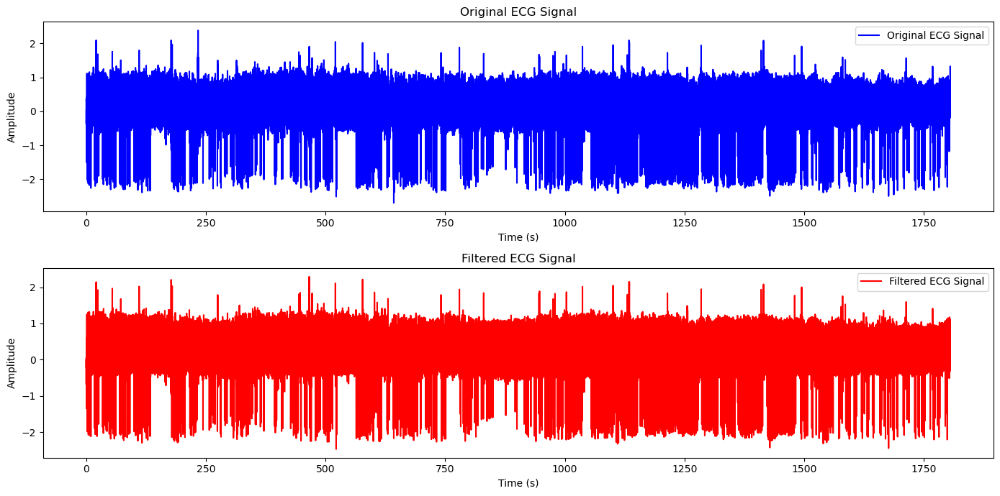

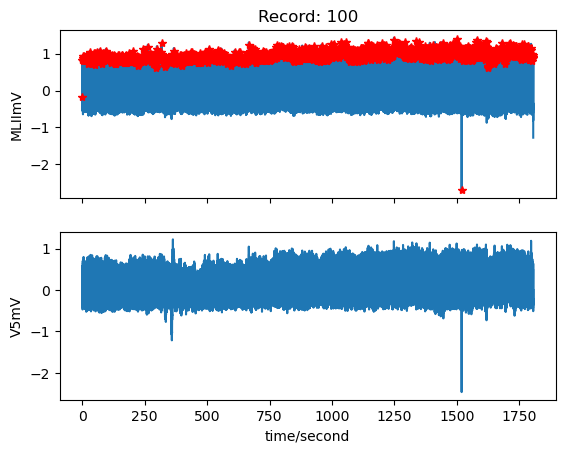

In [2]:
import os
import numpy as np
import matplotlib.pyplot as plt
import wfdb

# Define the path where your MIT-BIH dataset is stored
data_path = "/home/researchgroup/mahjabeen_workspace/research/CLINet-ECG-Classification-2024/data/mit-bih/mitbih_database/"

# Define the path where the processed signals are stored
processed_data_path = './save_processed_signals'

# Load an example normal (unfiltered) ECG signal and the corresponding filtered signal
record_name = '200'  # Example record name, change as needed

# Load the original signal (assuming you saved the original somewhere)
# If you haven't saved the original signal as a .npy file, you can directly load it from the wfdb records.
record = wfdb.rdrecord(os.path.join(data_path, record_name))
original_signal = record.p_signal[:, 0]  # Using the first lead (usually lead II)

# Load the filtered signal
filtered_signal_path = os.path.join(processed_data_path, f'{record_name}_filtered.npy')
filtered_signal = np.load(filtered_signal_path)

# Define the sampling rate
fs = 360  # Sampling rate in Hz

# Define the time axis for the signals
time_axis = np.arange(len(original_signal)) / fs

# Plot the original and filtered signals
plt.figure(figsize=(14, 7))

# Plot original signal
plt.subplot(2, 1, 1)
plt.plot(time_axis, original_signal, label='Original ECG Signal', color='b')
plt.title('Original ECG Signal')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')
plt.legend()

# Plot filtered signal
plt.subplot(2, 1, 2)
plt.plot(time_axis, filtered_signal, label='Filtered ECG Signal', color='r')
plt.title('Filtered ECG Signal')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')
plt.legend()

# Adjust layout and show the plots
plt.tight_layout()
plt.show()

# Load a specific record for visualization
record = wfdb.rdrecord(os.path.join(data_path, '100'))
# Load annotations
annotation = wfdb.rdann(os.path.join(data_path, '100'), 'atr')

# View the record with annotations
wfdb.plot_wfdb(record=record, annotation=annotation)


In [3]:
#Segmentation on Filtered Signals
import os
import numpy as np
import wfdb
from scipy.signal import butter, filtfilt

# Define the path where your MIT-BIH dataset is stored
data_path = "/home/researchgroup/mahjabeen_workspace/research/CLINet-ECG-Classification-2024/data/mit-bih/mitbih_database/"

# Define the path where the segmented heartbeats will be stored
segmented_heartbeats_path = './segmented_heartbeats'
os.makedirs(segmented_heartbeats_path, exist_ok=True)

# List of all records in the dataset
record_list = ['100', '101', '102', '103', '104', '105', '106', '107', '108', '109',
               '111', '112', '113', '114', '115', '116', '117', '118', '119', '121',
               '122', '123', '124', '200', '201', '202', '203', '205', '207', '208',
               '209', '210', '212', '213', '214', '215', '217', '219', '220', '221',
               '222', '223', '228', '230', '231', '232', '233', '234']

# Function to apply bandpass filter
def bandpass_filter(signal, lowcut=0.5, highcut=50.0, fs=360, order=5):
    nyquist = 0.5 * fs
    low = lowcut / nyquist
    high = highcut / nyquist
    b, a = butter(order, [low, high], btype='band')
    return filtfilt(b, a, signal)

# Function to segment heartbeats from filtered ECG
def segment_heartbeat(filtered_ecg, r_peaks, window_size=324):
    heartbeats = []
    for r_peak in r_peaks:
        if r_peak - 144 >= 0 and r_peak + 180 < len(filtered_ecg):
            heartbeats.append(filtered_ecg[r_peak - 144: r_peak + 180])
    return np.array(heartbeats)

# Process each record
for record_name in record_list:
    try:
        print(f'Processing record: {record_name}')
        
        # Load the record and annotations
        record = wfdb.rdrecord(os.path.join(data_path, record_name))
        annotation = wfdb.rdann(os.path.join(data_path, record_name), 'atr')
        
        # Get the ECG signal and apply bandpass filter
        ecg_signal = record.p_signal[:, 0]  # Use lead II (usually the first channel)
        filtered_ecg = bandpass_filter(ecg_signal)
        
        # Extract R-peak locations
        r_peaks = annotation.sample
        
        # Segment the heartbeats from filtered ECG
        heartbeats = segment_heartbeat(filtered_ecg, r_peaks)
        print(f'Number of heartbeats for record {record_name}: {len(heartbeats)}')
        
        # Save the segmented heartbeats
        save_path = os.path.join(segmented_heartbeats_path, f'{record_name}_heartbeats.npy')
        np.save(save_path, heartbeats)
        print(f'Saved heartbeats for record {record_name} at {save_path}')
        
    except Exception as e:
        print(f'Error processing record {record_name}: {e}')

print('Processing complete!')


Processing record: 100
Number of heartbeats for record 100: 2271
Saved heartbeats for record 100 at ./segmented_heartbeats/100_heartbeats.npy
Processing record: 101
Number of heartbeats for record 101: 1872
Saved heartbeats for record 101 at ./segmented_heartbeats/101_heartbeats.npy
Processing record: 102
Number of heartbeats for record 102: 2189
Saved heartbeats for record 102 at ./segmented_heartbeats/102_heartbeats.npy
Processing record: 103
Number of heartbeats for record 103: 2089
Saved heartbeats for record 103 at ./segmented_heartbeats/103_heartbeats.npy
Processing record: 104
Number of heartbeats for record 104: 2308
Saved heartbeats for record 104 at ./segmented_heartbeats/104_heartbeats.npy
Processing record: 105
Number of heartbeats for record 105: 2690
Saved heartbeats for record 105 at ./segmented_heartbeats/105_heartbeats.npy
Processing record: 106
Number of heartbeats for record 106: 2097
Saved heartbeats for record 106 at ./segmented_heartbeats/106_heartbeats.npy
Proces

In [2]:
import os
import numpy as np
from pyts.image import RecurrencePlot, GramianAngularField, MarkovTransitionField
from skimage.transform import resize

# Define the path where the segmented heartbeats are stored
segmented_heartbeats_path = './segmented_heartbeats'

# Define the paths to save the transformed images
rp_images_path = './transformed_images/rp'
gaf_images_path = './transformed_images/gaf'
mtf_images_path = './transformed_images/mtf'

# Create directories if they do not exist
os.makedirs(rp_images_path, exist_ok=True)
os.makedirs(gaf_images_path, exist_ok=True)
os.makedirs(mtf_images_path, exist_ok=True)

# List of all records in the dataset
record_list = ['100', '101', '102', '103', '104', '105', '106', '107', '108', '109',
               '111', '112', '113', '114', '115', '116', '117', '118', '119', '121',
               '122', '123', '124', '200', '201', '202', '203', '205', '207', '208',
               '209', '210', '212', '213', '214', '215', '217', '219', '220', '221',
               '222', '223', '228', '230', '231', '232', '233', '234']

# Function to generate Recurrence Plot images
def generate_rp_images(heartbeats):
    rp = RecurrencePlot(threshold='point', percentage=10)
    rp_images = rp.fit_transform(heartbeats)
    return rp_images

# Function to generate Gramian Angular Field images
def generate_gaf_images(heartbeats):
    gaf = GramianAngularField(method='summation')
    gaf_images = gaf.fit_transform(heartbeats)
    return gaf_images

# Function to generate Markov Transition Field images
def generate_mtf_images(heartbeats):
    mtf = MarkovTransitionField()
    mtf_images = mtf.fit_transform(heartbeats)
    return mtf_images

# Function to downsample images
def downsample_images(images, new_size=(128, 128)):
    return np.array([resize(img, new_size, anti_aliasing=True) for img in images])

# Process each record
for record_name in record_list:
    try:
        print(f'Processing record: {record_name}')
        
        # Load the segmented heartbeats
        heartbeats_path = os.path.join(segmented_heartbeats_path, f'{record_name}_heartbeats.npy')
        heartbeats = np.load(heartbeats_path)
        
        # Transform the heartbeats to RP images
        rp_images = generate_rp_images(heartbeats)
        rp_images_downsampled = downsample_images(rp_images, new_size=(128, 128))
        print(f'RP Images Shape for record {record_name}: {rp_images_downsampled.shape}')
        rp_save_path = os.path.join(rp_images_path, f'{record_name}_rp_images.npy')
        np.save(rp_save_path, rp_images_downsampled)
        print(f'Saved RP images for record {record_name} at {rp_save_path}')
        
        # Transform the heartbeats to GAF images
        gaf_images = generate_gaf_images(heartbeats)
        gaf_images_downsampled = downsample_images(gaf_images, new_size=(128, 128))
        print(f'GAF Images Shape for record {record_name}: {gaf_images_downsampled.shape}')
        gaf_save_path = os.path.join(gaf_images_path, f'{record_name}_gaf_images.npy')
        np.save(gaf_save_path, gaf_images_downsampled)
        print(f'Saved GAF images for record {record_name} at {gaf_save_path}')
        
        # Transform the heartbeats to MTF images
        mtf_images = generate_mtf_images(heartbeats)
        mtf_images_downsampled = downsample_images(mtf_images, new_size=(128, 128))
        print(f'MTF Images Shape for record {record_name}: {mtf_images_downsampled.shape}')
        mtf_save_path = os.path.join(mtf_images_path, f'{record_name}_mtf_images.npy')
        np.save(mtf_save_path, mtf_images_downsampled)
        print(f'Saved MTF images for record {record_name} at {mtf_save_path}')
        
    except Exception as e:
        print(f'Error processing record {record_name}: {e}')

print('Transformation complete!')


Processing record: 100
RP Images Shape for record 100: (2271, 128, 128)
Saved RP images for record 100 at ./transformed_images/rp/100_rp_images.npy
GAF Images Shape for record 100: (2271, 128, 128)
Saved GAF images for record 100 at ./transformed_images/gaf/100_gaf_images.npy
MTF Images Shape for record 100: (2271, 128, 128)
Saved MTF images for record 100 at ./transformed_images/mtf/100_mtf_images.npy
Processing record: 101
RP Images Shape for record 101: (1872, 128, 128)
Saved RP images for record 101 at ./transformed_images/rp/101_rp_images.npy
GAF Images Shape for record 101: (1872, 128, 128)
Saved GAF images for record 101 at ./transformed_images/gaf/101_gaf_images.npy
MTF Images Shape for record 101: (1872, 128, 128)
Saved MTF images for record 101 at ./transformed_images/mtf/101_mtf_images.npy
Processing record: 102
RP Images Shape for record 102: (2189, 128, 128)
Saved RP images for record 102 at ./transformed_images/rp/102_rp_images.npy
GAF Images Shape for record 102: (2189, 

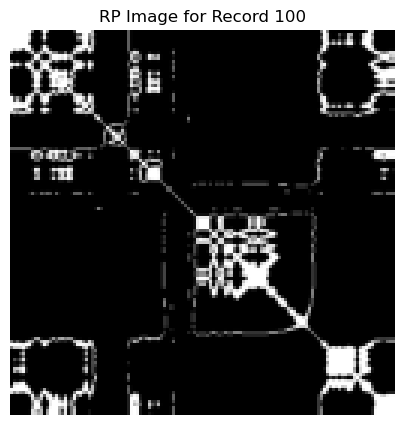

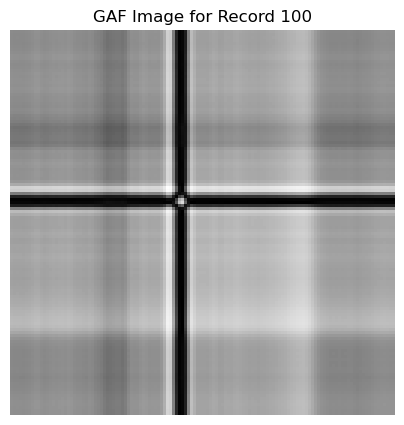

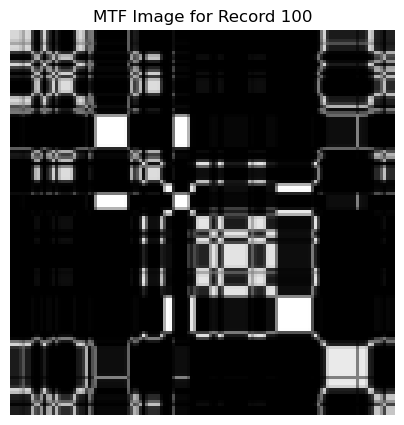

In [3]:
import numpy as np
import matplotlib.pyplot as plt

# Load and display RP images for a record
rp_images_path = './transformed_images/rp/100_rp_images.npy'
rp_images = np.load(rp_images_path)

plt.figure(figsize=(5, 5))
plt.imshow(rp_images[0], cmap='gray')
plt.title('RP Image for Record 100')
plt.axis('off')
plt.show()

# Load and display GAF images for a record
gaf_images_path = './transformed_images/gaf/100_gaf_images.npy'
gaf_images = np.load(gaf_images_path)

plt.figure(figsize=(5, 5))
plt.imshow(gaf_images[0], cmap='gray')
plt.title('GAF Image for Record 100')
plt.axis('off')
plt.show()

# Load and display MTF images for a record
mtf_images_path = './transformed_images/mtf/100_mtf_images.npy'
mtf_images = np.load(mtf_images_path)

plt.figure(figsize=(5, 5))
plt.imshow(mtf_images[0], cmap='gray')
plt.title('MTF Image for Record 100')
plt.axis('off')
plt.show()


Number of heartbeat segments in record 100: 2271


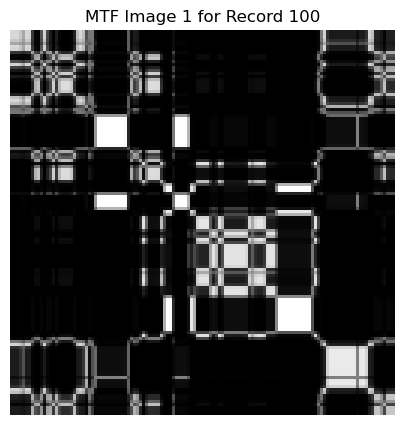

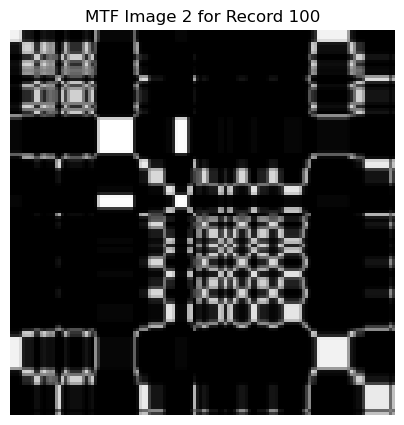

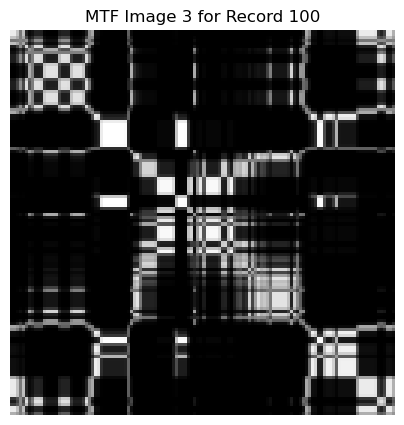

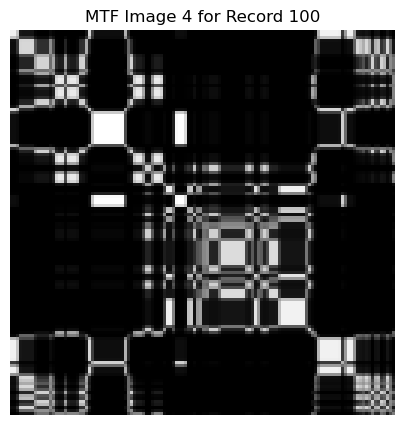

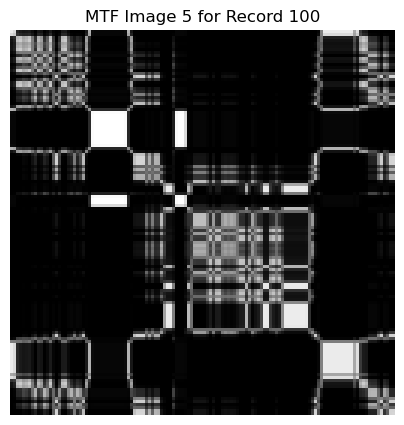

Shape of the first MTF image: (128, 128)


In [4]:
import numpy as np
import matplotlib.pyplot as plt

# Load the MTF images for record 100
mtf_images_path = './transformed_images/mtf/100_mtf_images.npy'
mtf_images = np.load(mtf_images_path)

# Number of heartbeat segments
num_segments = mtf_images.shape[0]
print(f'Number of heartbeat segments in record 100: {num_segments}')

# Visualize the first 5 heartbeat segments
for i in range(5):
    plt.figure(figsize=(5, 5))
    plt.imshow(mtf_images[i], cmap='gray')
    plt.title(f'MTF Image {i+1} for Record 100')
    plt.axis('off')
    plt.show()

# Access the first heartbeat segment
first_segment_mtf = mtf_images[0]
print(f'Shape of the first MTF image: {first_segment_mtf.shape}')


R-peaks: [    18     77    370 ... 649484 649734 649991]
Labels: ['+', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'A', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'N',

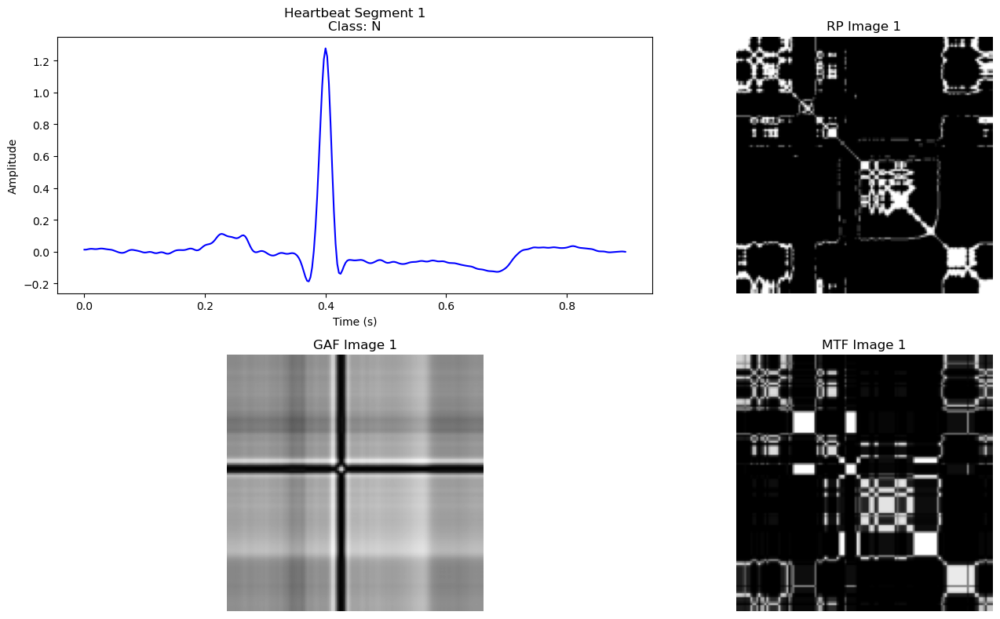

In [5]:
import os
import numpy as np
import matplotlib.pyplot as plt
import wfdb

# Define paths
segmented_heartbeats_path = './segmented_heartbeats'
transformed_images_path = './transformed_images'
data_path = '/home/researchgroup/mahjabeen_workspace/research/CLINet-ECG-Classification-2024/data/mit-bih/mitbih_database/'  # Path to the MIT-BIH database

# Define the record and load the data
record_name = '100'  # Example record, change as needed
heartbeats_path = os.path.join(segmented_heartbeats_path, f'{record_name}_heartbeats.npy')
rp_images_path = os.path.join(transformed_images_path, 'rp', f'{record_name}_rp_images.npy')
gaf_images_path = os.path.join(transformed_images_path, 'gaf', f'{record_name}_gaf_images.npy')
mtf_images_path = os.path.join(transformed_images_path, 'mtf', f'{record_name}_mtf_images.npy')

# Load the segmented heartbeats
heartbeats = np.load(heartbeats_path)
rp_images = np.load(rp_images_path)
gaf_images = np.load(gaf_images_path)
mtf_images = np.load(mtf_images_path)

# Load annotations
annotation = wfdb.rdann(os.path.join(data_path, record_name), 'atr')

# Extract annotations
r_peaks = annotation.sample
labels = annotation.symbol  # Annotation symbols (labels)

# Print R-peaks and labels for debugging
print(f'R-peaks: {r_peaks}')
print(f'Labels: {labels}')

# Function to find the class of each heartbeat segment
def find_class_of_segment(index, heartbeat_length=324, fs=360):
    # Calculate the start and end of the segment in samples
    segment_start = index * heartbeat_length
    segment_center = segment_start + heartbeat_length // 2

    # Debugging: Print segment details
    print(f'Segment {index}: Start {segment_start}, Center {segment_center}')

    # Find the closest R-peak to the center of the segment
    closest_r_peak = min(r_peaks, key=lambda x: abs(x - segment_center))

    # Debugging: Print closest R-peak
    print(f'Closest R-peak: {closest_r_peak}')

    # Find the index of the closest R-peak
    closest_index = np.where(r_peaks == closest_r_peak)[0][0]

    # Return the class label for the closest R-peak
    return labels[closest_index]

# Function to visualize the heartbeat segment and transformed images with class
def visualize_heartbeat_and_transformed(index):
    if index >= len(heartbeats):
        print(f"Index {index} out of range for record {record_name}. Maximum index is {len(heartbeats)-1}.")
        return

    # Extract the heartbeat segment
    heartbeat_segment = heartbeats[index]
    
    # Extract the corresponding transformed images
    rp_image = rp_images[index]
    gaf_image = gaf_images[index]
    mtf_image = mtf_images[index]

    # Find the class or annotation for the segment
    heartbeat_class = find_class_of_segment(index)

    # Create a time axis for the heartbeat segment
    fs = 360  # Sampling rate in Hz
    time_axis = np.arange(len(heartbeat_segment)) / fs

    # Plot the heartbeat segment
    plt.figure(figsize=(15, 8))

    plt.subplot(2, 2, 1)
    plt.plot(time_axis, heartbeat_segment, color='blue')
    plt.title(f'Heartbeat Segment {index+1}\nClass: {heartbeat_class}')
    plt.xlabel('Time (s)')
    plt.ylabel('Amplitude')

    # Plot the Recurrence Plot image
    plt.subplot(2, 2, 2)
    plt.imshow(rp_image, cmap='gray')
    plt.title(f'RP Image {index+1}')
    plt.axis('off')

    # Plot the Gramian Angular Field image
    plt.subplot(2, 2, 3)
    plt.imshow(gaf_image, cmap='gray')
    plt.title(f'GAF Image {index+1}')
    plt.axis('off')

    # Plot the Markov Transition Field image
    plt.subplot(2, 2, 4)
    plt.imshow(mtf_image, cmap='gray')
    plt.title(f'MTF Image {index+1}')
    plt.axis('off')

    plt.tight_layout()
    plt.show()

# Visualize the first heartbeat segment and its transformed images with class
visualize_heartbeat_and_transformed(0)  # Change the index to visualize other segments


R-peaks: [  18   77  370  662  946 1231 1515 1809 2044 2402]
Original Labels: ['+', 'N', 'N', 'N', 'N', 'N', 'N', 'N', 'A', 'N']
AAMI Classes: ['Unknown', 'Normal', 'Normal', 'Normal', 'Normal', 'Normal', 'Normal', 'Normal', 'SVEB', 'Normal']
Segment 0: Start 0, Center 162
Closest R-peak: 77
AAMI Class: Normal


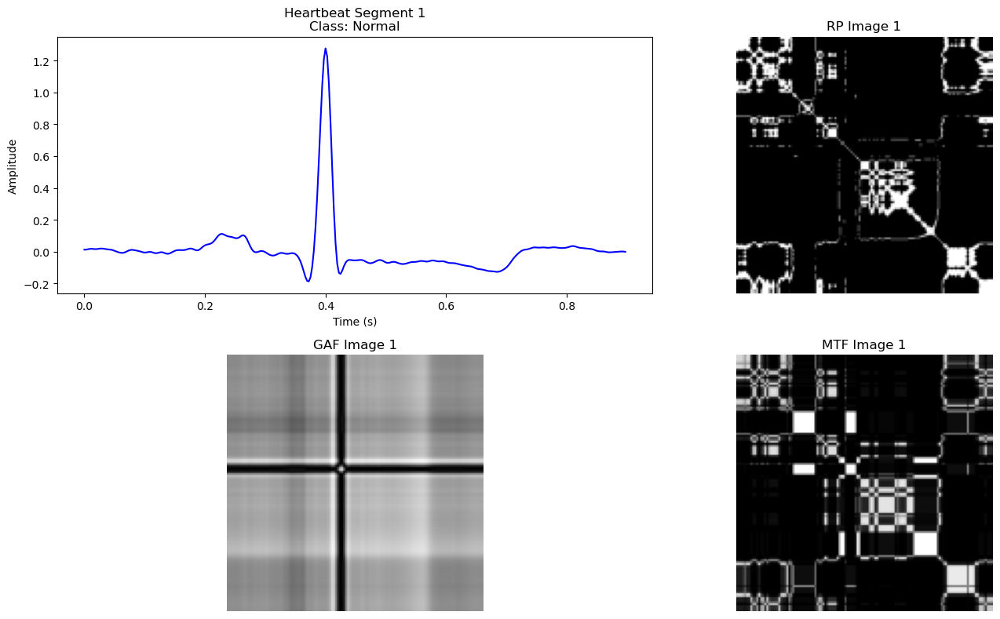

In [6]:
import os
import numpy as np
import matplotlib.pyplot as plt
import wfdb

# Define paths
segmented_heartbeats_path = './segmented_heartbeats'
transformed_images_path = './transformed_images'
data_path = '/home/researchgroup/mahjabeen_workspace/research/CLINet-ECG-Classification-2024/data/mit-bih/mitbih_database/'  # Path to the MIT-BIH database

# Define the record and load the data
record_name = '100'  # Example record, change as needed
heartbeats_path = os.path.join(segmented_heartbeats_path, f'{record_name}_heartbeats.npy')
rp_images_path = os.path.join(transformed_images_path, 'rp', f'{record_name}_rp_images.npy')
gaf_images_path = os.path.join(transformed_images_path, 'gaf', f'{record_name}_gaf_images.npy')
mtf_images_path = os.path.join(transformed_images_path, 'mtf', f'{record_name}_mtf_images.npy')

# Load the segmented heartbeats
heartbeats = np.load(heartbeats_path)
rp_images = np.load(rp_images_path)
gaf_images = np.load(gaf_images_path)
mtf_images = np.load(mtf_images_path)

# Load annotations
annotation = wfdb.rdann(os.path.join(data_path, record_name), 'atr')

# Extract annotations
r_peaks = annotation.sample
labels = annotation.symbol  # Annotation symbols (labels)

# Define the AAMI class mapping
aami_mapping = {
    'N': 'Normal',
    'L': 'Normal',
    'R': 'Normal',
    'e': 'Normal',
    'j': 'Normal',
    'A': 'SVEB',
    'a': 'SVEB',
    'J': 'SVEB',
    'S': 'SVEB',
    'V': 'VEB',
    'E': 'VEB',
    'F': 'Fusion',
    '/': 'Unknown',
    'f': 'Unknown',
    'Q': 'Unknown'
}

# Map the MIT-BIH annotations to AAMI classes
aami_labels = [aami_mapping.get(label, 'Unknown') for label in labels]

# Debugging: Print the first few annotations and their AAMI classes
print(f'R-peaks: {r_peaks[:10]}')
print(f'Original Labels: {labels[:10]}')
print(f'AAMI Classes: {aami_labels[:10]}')

# Function to find the class of each heartbeat segment
def find_class_of_segment(index, heartbeat_length=324, fs=360):
    # Calculate the start and end of the segment in samples
    segment_start = index * heartbeat_length
    segment_center = segment_start + heartbeat_length // 2

    # Find the closest R-peak to the center of the segment
    closest_r_peak = min(r_peaks, key=lambda x: abs(x - segment_center))

    # Find the index of the closest R-peak
    closest_index = np.where(r_peaks == closest_r_peak)[0][0]

    # Debugging: Print segment details
    print(f'Segment {index}: Start {segment_start}, Center {segment_center}')
    print(f'Closest R-peak: {closest_r_peak}')
    print(f'AAMI Class: {aami_labels[closest_index]}')

    # Return the class label for the closest R-peak
    return aami_labels[closest_index]

# Function to visualize the heartbeat segment and transformed images with class
def visualize_heartbeat_and_transformed(index):
    if index >= len(heartbeats):
        print(f"Index {index} out of range for record {record_name}. Maximum index is {len(heartbeats)-1}.")
        return

    # Extract the heartbeat segment
    heartbeat_segment = heartbeats[index]
    
    # Extract the corresponding transformed images
    rp_image = rp_images[index]
    gaf_image = gaf_images[index]
    mtf_image = mtf_images[index]

    # Find the class or annotation for the segment
    heartbeat_class = find_class_of_segment(index)

    # Create a time axis for the heartbeat segment
    fs = 360  # Sampling rate in Hz
    time_axis = np.arange(len(heartbeat_segment)) / fs

    # Plot the heartbeat segment
    plt.figure(figsize=(15, 8))

    plt.subplot(2, 2, 1)
    plt.plot(time_axis, heartbeat_segment, color='blue')
    plt.title(f'Heartbeat Segment {index+1}\nClass: {heartbeat_class}')
    plt.xlabel('Time (s)')
    plt.ylabel('Amplitude')

    # Plot the Recurrence Plot image
    plt.subplot(2, 2, 2)
    plt.imshow(rp_image, cmap='gray')
    plt.title(f'RP Image {index+1}')
    plt.axis('off')

    # Plot the Gramian Angular Field image
    plt.subplot(2, 2, 3)
    plt.imshow(gaf_image, cmap='gray')
    plt.title(f'GAF Image {index+1}')
    plt.axis('off')

    # Plot the Markov Transition Field image
    plt.subplot(2, 2, 4)
    plt.imshow(mtf_image, cmap='gray')
    plt.title(f'MTF Image {index+1}')
    plt.axis('off')

    plt.tight_layout()
    plt.show()

# Visualize the first heartbeat segment and its transformed images with class
visualize_heartbeat_and_transformed(0)  # Change the index to visualize other segments


In [7]:
# List of records to process
record_list = ['100', '101', '102', '103', '104', '105', '106', '107', '108', '109',
               '111', '112', '113', '114', '115', '116', '117', '118', '119', '121',
               '122', '123', '124', '200', '201', '202', '203', '205', '207', '208',
               '209', '210', '212', '213', '214', '215', '217', '219', '220', '221',
               '222', '223', '228', '230', '231', '232', '233', '234']

# Loop through each record and apply the process
for record_name in record_list:
    print(f'Processing record: {record_name}')
    heartbeats_path = os.path.join(segmented_heartbeats_path, f'{record_name}_heartbeats.npy')
    rp_images_path = os.path.join(transformed_images_path, 'rp', f'{record_name}_rp_images.npy')
    gaf_images_path = os.path.join(transformed_images_path, 'gaf', f'{record_name}_gaf_images.npy')
    mtf_images_path = os.path.join(transformed_images_path, 'mtf', f'{record_name}_mtf_images.npy')
    
    try:
        # Load the segmented heartbeats
        heartbeats = np.load(heartbeats_path)
        rp_images = np.load(rp_images_path)
        gaf_images = np.load(gaf_images_path)
        mtf_images = np.load(mtf_images_path)

        # Load annotations
        annotation = wfdb.rdann(os.path.join(data_path, record_name), 'atr')

        # Extract annotations
        r_peaks = annotation.sample
        labels = annotation.symbol

        # Map the MIT-BIH annotations to AAMI classes
        aami_labels = [aami_mapping.get(label, 'Unknown') for label in labels]

        # Process each segment
        for index in range(len(heartbeats)):
            # Extract the heartbeat segment
            heartbeat_segment = heartbeats[index]

            # Find the class or annotation for the segment
            heartbeat_class = find_class_of_segment(index)

            # Visualization or further processing
            # You can save the visualization or perform additional analysis here
            print(f'Segment {index}: Class: {heartbeat_class}')

    except Exception as e:
        print(f'Error processing record {record_name}: {e}')


Processing record: 100
Segment 0: Start 0, Center 162
Closest R-peak: 77
AAMI Class: Normal
Segment 0: Class: Normal
Segment 1: Start 324, Center 486
Closest R-peak: 370
AAMI Class: Normal
Segment 1: Class: Normal
Segment 2: Start 648, Center 810
Closest R-peak: 946
AAMI Class: Normal
Segment 2: Class: Normal
Segment 3: Start 972, Center 1134
Closest R-peak: 1231
AAMI Class: Normal
Segment 3: Class: Normal
Segment 4: Start 1296, Center 1458
Closest R-peak: 1515
AAMI Class: Normal
Segment 4: Class: Normal
Segment 5: Start 1620, Center 1782
Closest R-peak: 1809
AAMI Class: Normal
Segment 5: Class: Normal
Segment 6: Start 1944, Center 2106
Closest R-peak: 2044
AAMI Class: SVEB
Segment 6: Class: SVEB
Segment 7: Start 2268, Center 2430
Closest R-peak: 2402
AAMI Class: Normal
Segment 7: Class: Normal
Segment 8: Start 2592, Center 2754
Closest R-peak: 2706
AAMI Class: Normal
Segment 8: Class: Normal
Segment 9: Start 2916, Center 3078
Closest R-peak: 2998
AAMI Class: Normal
Segment 9: Class: N

In [8]:
import os
import numpy as np
import wfdb
from collections import Counter

# Define paths
data_path = '/home/researchgroup/mahjabeen_workspace/research/CLINet-ECG-Classification-2024/data/mit-bih/mitbih_database/'  # Path to the MIT-BIH database

# List of records to process
record_list = ['100', '101', '102', '103', '104', '105', '106', '107', '108', '109',
               '111', '112', '113', '114', '115', '116', '117', '118', '119', '121',
               '122', '123', '124', '200', '201', '202', '203', '205', '207', '208',
               '209', '210', '212', '213', '214', '215', '217', '219', '220', '221',
               '222', '223', '228', '230', '231', '232', '233', '234']

# Define the AAMI class mapping
aami_mapping = {
    'N': 'Normal',
    'L': 'Normal',
    'R': 'Normal',
    'e': 'Normal',
    'j': 'Normal',
    'A': 'SVEB',
    'a': 'SVEB',
    'J': 'SVEB',
    'S': 'SVEB',
    'V': 'VEB',
    'E': 'VEB',
    'F': 'Fusion',
    '/': 'Unknown',
    'f': 'Unknown',
    'Q': 'Unknown'
}

# Function to count labels in each record
def count_labels_in_record(record_name):
    try:
        # Load annotations
        annotation = wfdb.rdann(os.path.join(data_path, record_name), 'atr')

        # Extract annotations
        labels = annotation.symbol  # Annotation symbols (labels)

        # Map the MIT-BIH annotations to AAMI classes
        aami_labels = [aami_mapping.get(label, 'Unknown') for label in labels]

        # Count occurrences of each AAMI class
        label_counts = Counter(aami_labels)

        return label_counts
    except Exception as e:
        print(f'Error processing record {record_name}: {e}')
        return None

# Process each record and display the counts
for record_name in record_list:
    print(f'Processing record: {record_name}')
    label_counts = count_labels_in_record(record_name)
    if label_counts:
        print(f'Label counts for record {record_name}: {label_counts}')
    else:
        print(f'No labels found for record {record_name}')

print('Label counting complete!')


Processing record: 100
Label counts for record 100: Counter({'Normal': 2239, 'SVEB': 33, 'Unknown': 1, 'VEB': 1})
Processing record: 101
Label counts for record 101: Counter({'Normal': 1860, 'Unknown': 11, 'SVEB': 3})
Processing record: 102
Label counts for record 102: Counter({'Unknown': 2089, 'Normal': 99, 'VEB': 4})
Processing record: 103
Label counts for record 103: Counter({'Normal': 2082, 'Unknown': 7, 'SVEB': 2})
Processing record: 104
Label counts for record 104: Counter({'Unknown': 2146, 'Normal': 163, 'VEB': 2})
Processing record: 105
Label counts for record 105: Counter({'Normal': 2526, 'Unknown': 124, 'VEB': 41})
Processing record: 106
Label counts for record 106: Counter({'Normal': 1507, 'VEB': 520, 'Unknown': 71})
Processing record: 107
Label counts for record 107: Counter({'Unknown': 2081, 'VEB': 59})
Processing record: 108
Label counts for record 108: Counter({'Normal': 1740, 'Unknown': 61, 'VEB': 17, 'SVEB': 4, 'Fusion': 2})
Processing record: 109
Label counts for reco

In [9]:
import os
import numpy as np

# Define paths to transformed images
transformed_images_path = './transformed_images'
combined_images_path = './combined_images'
os.makedirs(combined_images_path, exist_ok=True)

# List of records to process
record_list = ['100', '101', '102', '103', '104', '105', '106', '107', '108', '109',
               '111', '112', '113', '114', '115', '116', '117', '118', '119', '121',
               '122', '123', '124', '200', '201', '202', '203', '205', '207', '208',
               '209', '210', '212', '213', '214', '215', '217', '219', '220', '221',
               '222', '223', '228', '230', '231', '232', '233', '234']

# Function to combine RP, GAF, and MTF images into a single 3-channel image
def combine_images(record_name):
    try:
        rp_images_path = os.path.join(transformed_images_path, 'rp', f'{record_name}_rp_images.npy')
        gaf_images_path = os.path.join(transformed_images_path, 'gaf', f'{record_name}_gaf_images.npy')
        mtf_images_path = os.path.join(transformed_images_path, 'mtf', f'{record_name}_mtf_images.npy')
        
        # Load images
        rp_images = np.load(rp_images_path)
        gaf_images = np.load(gaf_images_path)
        mtf_images = np.load(mtf_images_path)
        
        num_images = rp_images.shape[0]
        combined_images = []

        for i in range(num_images):
            rp_image = rp_images[i]
            gaf_image = gaf_images[i]
            mtf_image = mtf_images[i]
            
            # Ensure all images are of the same size
            if rp_image.shape != gaf_image.shape or gaf_image.shape != mtf_image.shape:
                raise ValueError(f"Image dimensions do not match for record {record_name}.")
            
            # Stack images to create a 3-channel image
            combined_image = np.stack((rp_image, gaf_image, mtf_image), axis=-1)
            combined_images.append(combined_image)
        
        combined_images = np.array(combined_images)
        save_path = os.path.join(combined_images_path, f'{record_name}_combined_images.npy')
        np.save(save_path, combined_images)
        print(f'Saved combined images for record {record_name} at {save_path}')

    except Exception as e:
        print(f'Error processing record {record_name}: {e}')

# Process each record
for record_name in record_list:
    print(f'Processing record: {record_name}')
    combine_images(record_name)

print('Combining images complete!')


Processing record: 100
Saved combined images for record 100 at ./combined_images/100_combined_images.npy
Processing record: 101
Saved combined images for record 101 at ./combined_images/101_combined_images.npy
Processing record: 102
Saved combined images for record 102 at ./combined_images/102_combined_images.npy
Processing record: 103
Saved combined images for record 103 at ./combined_images/103_combined_images.npy
Processing record: 104
Saved combined images for record 104 at ./combined_images/104_combined_images.npy
Processing record: 105
Saved combined images for record 105 at ./combined_images/105_combined_images.npy
Processing record: 106
Saved combined images for record 106 at ./combined_images/106_combined_images.npy
Processing record: 107
Saved combined images for record 107 at ./combined_images/107_combined_images.npy
Processing record: 108
Saved combined images for record 108 at ./combined_images/108_combined_images.npy
Processing record: 109
Saved combined images for record

In [10]:
import os
import numpy as np
import wfdb
from collections import Counter

# Define paths
data_path = '/home/researchgroup/mahjabeen_workspace/research/CLINet-ECG-Classification-2024/data/mit-bih/mitbih_database/'
segmented_heartbeats_path = './segmented_heartbeats'
transformed_images_path = './transformed_images'
combined_images_path = './combined_images'
labels_path = './labels'
os.makedirs(combined_images_path, exist_ok=True)
os.makedirs(labels_path, exist_ok=True)

# List of records to process
record_list = ['100', '101', '102', '103', '104', '105', '106', '107', '108', '109',
               '111', '112', '113', '114', '115', '116', '117', '118', '119', '121',
               '122', '123', '124', '200', '201', '202', '203', '205', '207', '208',
               '209', '210', '212', '213', '214', '215', '217', '219', '220', '221',
               '222', '223', '228', '230', '231', '232', '233', '234']

# Define the AAMI class mapping
aami_mapping = {
    'N': 'Normal',
    'L': 'Normal',
    'R': 'Normal',
    'e': 'Normal',
    'j': 'Normal',
    'A': 'SVEB',
    'a': 'SVEB',
    'J': 'SVEB',
    'S': 'SVEB',
    'V': 'VEB',
    'E': 'VEB',
    'F': 'Fusion',
    '/': 'Unknown',
    'f': 'Unknown',
    'Q': 'Unknown'
}

# Function to combine images and save labels
def combine_images_and_save_labels(record_name):
    try:
        rp_images_path = os.path.join(transformed_images_path, 'rp', f'{record_name}_rp_images.npy')
        gaf_images_path = os.path.join(transformed_images_path, 'gaf', f'{record_name}_gaf_images.npy')
        mtf_images_path = os.path.join(transformed_images_path, 'mtf', f'{record_name}_mtf_images.npy')
        
        # Load images
        rp_images = np.load(rp_images_path)
        gaf_images = np.load(gaf_images_path)
        mtf_images = np.load(mtf_images_path)
        
        num_images = rp_images.shape[0]
        combined_images = []

        for i in range(num_images):
            rp_image = rp_images[i]
            gaf_image = gaf_images[i]
            mtf_image = mtf_images[i]
            
            # Ensure all images are of the same size
            if rp_image.shape != gaf_image.shape or gaf_image.shape != mtf_image.shape:
                raise ValueError(f"Image dimensions do not match for record {record_name}.")
            
            # Stack images to create a 3-channel image
            combined_image = np.stack((rp_image, gaf_image, mtf_image), axis=-1)
            combined_images.append(combined_image)
        
        combined_images = np.array(combined_images)
        save_path = os.path.join(combined_images_path, f'{record_name}_combined_images.npy')
        np.save(save_path, combined_images)
        print(f'Saved combined images for record {record_name} at {save_path}')

        # Load annotations
        annotation = wfdb.rdann(os.path.join(data_path, record_name), 'atr')
        r_peaks = annotation.sample
        labels = annotation.symbol
        
        # Map the MIT-BIH annotations to AAMI classes
        aami_labels = [aami_mapping.get(label, 'Unknown') for label in labels]
        
        # Generate labels for each heartbeat segment
        segment_labels = []
        for r_peak in r_peaks:
            # Ensure segment is within the range of the ECG signal
            if r_peak - 144 >= 0 and r_peak + 180 < len(rp_images):
                closest_index = np.where(r_peaks == r_peak)[0][0]
                segment_labels.append(aami_labels[closest_index])

        # Save the labels
        labels_save_path = os.path.join(labels_path, f'{record_name}_labels.npy')
        np.save(labels_save_path, segment_labels)
        print(f'Saved labels for record {record_name} at {labels_save_path}')

    except Exception as e:
        print(f'Error processing record {record_name}: {e}')

# Process each record
for record_name in record_list:
    print(f'Processing record: {record_name}')
    combine_images_and_save_labels(record_name)

print('Combining images and saving labels complete!')


Processing record: 100
Saved combined images for record 100 at ./combined_images/100_combined_images.npy
Saved labels for record 100 at ./labels/100_labels.npy
Processing record: 101
Saved combined images for record 101 at ./combined_images/101_combined_images.npy
Saved labels for record 101 at ./labels/101_labels.npy
Processing record: 102
Saved combined images for record 102 at ./combined_images/102_combined_images.npy
Saved labels for record 102 at ./labels/102_labels.npy
Processing record: 103
Saved combined images for record 103 at ./combined_images/103_combined_images.npy
Saved labels for record 103 at ./labels/103_labels.npy
Processing record: 104
Saved combined images for record 104 at ./combined_images/104_combined_images.npy
Saved labels for record 104 at ./labels/104_labels.npy
Processing record: 105
Saved combined images for record 105 at ./combined_images/105_combined_images.npy
Saved labels for record 105 at ./labels/105_labels.npy
Processing record: 106
Saved combined im

In [34]:
import os
import numpy as np
import wfdb

# Define paths to transformed images and combined images
transformed_images_path = './transformed_images'
combined_images_path = './combined_images'
labels_path = './labels'
os.makedirs(combined_images_path, exist_ok=True)
os.makedirs(labels_path, exist_ok=True)

# List of records to process
record_list = ['100', '101', '102', '103', '104', '105', '106', '107', '108', '109',
               '111', '112', '113', '114', '115', '116', '117', '118', '119', '121',
               '122', '123', '124', '200', '201', '202', '203', '205', '207', '208',
               '209', '210', '212', '213', '214', '215', '217', '219', '220', '221',
               '222', '223', '228', '230', '231', '232', '233', '234']

# Function to combine RP, GAF, and MTF images into a single 3-channel image
def combine_images_and_labels(record_name):
    try:
        rp_images_path = os.path.join(transformed_images_path, 'rp', f'{record_name}_rp_images.npy')
        gaf_images_path = os.path.join(transformed_images_path, 'gaf', f'{record_name}_gaf_images.npy')
        mtf_images_path = os.path.join(transformed_images_path, 'mtf', f'{record_name}_mtf_images.npy')
        
        # Load images
        rp_images = np.load(rp_images_path)
        gaf_images = np.load(gaf_images_path)
        mtf_images = np.load(mtf_images_path)

        # Load annotations
        annotation = wfdb.rdann(os.path.join(data_path, record_name), 'atr')
        r_peaks = annotation.sample
        labels = annotation.symbol

        # Map the MIT-BIH annotations to AAMI classes
        aami_mapping = {
            'N': 'Normal',
            'L': 'Normal',
            'R': 'Normal',
            'e': 'Normal',
            'j': 'Normal',
            'A': 'SVEB',
            'a': 'SVEB',
            'J': 'SVEB',
            'S': 'SVEB',
            'V': 'VEB',
            'E': 'VEB',
            'F': 'Fusion',
            '/': 'Unknown',
            'f': 'Unknown',
            'Q': 'Unknown'
        }
        aami_labels = [aami_mapping.get(label, 'Unknown') for label in labels]

        num_images = rp_images.shape[0]
        combined_images = []
        combined_labels = []

        for i in range(num_images):
            rp_image = rp_images[i]
            gaf_image = gaf_images[i]
            mtf_image = mtf_images[i]
            
            # Combine images to create a 3-channel image
            combined_image = np.stack((rp_image, gaf_image, mtf_image), axis=-1)
            combined_images.append(combined_image)

            # Calculate the center of the segment and find the closest R-peak
            segment_center = i * 324 + 162
            closest_r_peak = min(r_peaks, key=lambda x: abs(x - segment_center))
            closest_index = np.where(r_peaks == closest_r_peak)[0][0]
            combined_labels.append(aami_labels[closest_index])
        
        combined_images = np.array(combined_images)
        combined_labels = np.array(combined_labels)

        # Save combined images and labels
        save_images_path = os.path.join(combined_images_path, f'{record_name}_combined_images.npy')
        save_labels_path = os.path.join(labels_path, f'{record_name}_labels.npy')
        np.save(save_images_path, combined_images)
        np.save(save_labels_path, combined_labels)
        print(f'Saved combined images and labels for record {record_name}')

    except Exception as e:
        print(f'Error processing record {record_name}: {e}')

# Process each record
for record_name in record_list:
    print(f'Processing record: {record_name}')
    combine_images_and_labels(record_name)

print('Combining images and labels complete!')


Processing record: 100
Saved combined images and labels for record 100
Processing record: 101
Saved combined images and labels for record 101
Processing record: 102
Saved combined images and labels for record 102
Processing record: 103
Saved combined images and labels for record 103
Processing record: 104
Saved combined images and labels for record 104
Processing record: 105
Saved combined images and labels for record 105
Processing record: 106
Saved combined images and labels for record 106
Processing record: 107
Saved combined images and labels for record 107
Processing record: 108
Saved combined images and labels for record 108
Processing record: 109
Saved combined images and labels for record 109
Processing record: 111
Saved combined images and labels for record 111
Processing record: 112
Saved combined images and labels for record 112
Processing record: 113
Saved combined images and labels for record 113
Processing record: 114
Saved combined images and labels for record 114
Proces

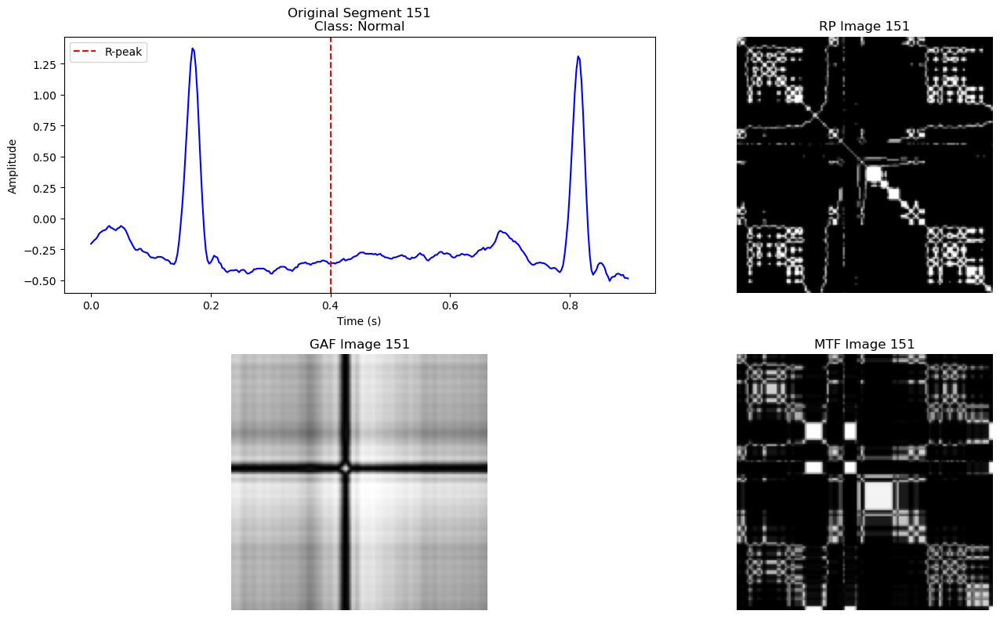

In [39]:
import os
import numpy as np
import matplotlib.pyplot as plt
import wfdb

# Define paths
data_path = '/home/researchgroup/mahjabeen_workspace/research/CLINet-ECG-Classification-2024/data/mit-bih/mitbih_database/'  # Path to the MIT-BIH database
combined_images_path = './combined_images'
labels_path = './labels'

# Function to load combined images and labels
def load_combined_data(record_name):
    combined_images_file = os.path.join(combined_images_path, f'{record_name}_combined_images.npy')
    labels_file = os.path.join(labels_path, f'{record_name}_labels.npy')
    combined_images = np.load(combined_images_file)
    labels = np.load(labels_file)
    return combined_images, labels

# Function to plot segment and transformed images
def plot_combined_images(record_name, segment_index):
    combined_images, labels = load_combined_data(record_name)
    
    # Load the full ECG signal for context
    record = wfdb.rdrecord(os.path.join(data_path, record_name))
    ecg_signal = record.p_signal[:, 0]  # Assuming the first channel is the desired ECG signal

    # Calculate the start and end of the segment in samples
    heartbeat_length = 324
    segment_start = segment_index * heartbeat_length
    segment_end = segment_start + heartbeat_length

    if segment_end > len(ecg_signal):
        print(f"Segment index {segment_index} exceeds ECG signal length for record {record_name}.")
        return

    # Extract the original ECG segment
    original_segment = ecg_signal[segment_start:segment_end]

    # Extract the combined image and label
    combined_image = combined_images[segment_index]
    label = labels[segment_index]

    # Create a time axis for the ECG segment
    fs = 360  # Sampling rate in Hz
    time_axis = np.arange(len(original_segment)) / fs

    # Plot the ECG segment and combined image
    plt.figure(figsize=(15, 8))

    plt.subplot(2, 2, 1)
    plt.plot(time_axis, original_segment, color='blue')
    plt.axvline(x=(144/fs), color='r', linestyle='--', label='R-peak')
    plt.title(f'Original Segment {segment_index + 1}\nClass: {label}')
    plt.xlabel('Time (s)')
    plt.ylabel('Amplitude')
    plt.legend()

    # Plot the combined image
    plt.subplot(2, 2, 2)
    plt.imshow(combined_image[:, :, 0], cmap='gray')
    plt.title(f'RP Image {segment_index + 1}')
    plt.axis('off')

    plt.subplot(2, 2, 3)
    plt.imshow(combined_image[:, :, 1], cmap='gray')
    plt.title(f'GAF Image {segment_index + 1}')
    plt.axis('off')

    plt.subplot(2, 2, 4)
    plt.imshow(combined_image[:, :, 2], cmap='gray')
    plt.title(f'MTF Image {segment_index + 1}')
    plt.axis('off')

    plt.tight_layout()
    plt.show()

# Example usage
plot_combined_images('234', 150)  # Change record_name and segment_index as needed


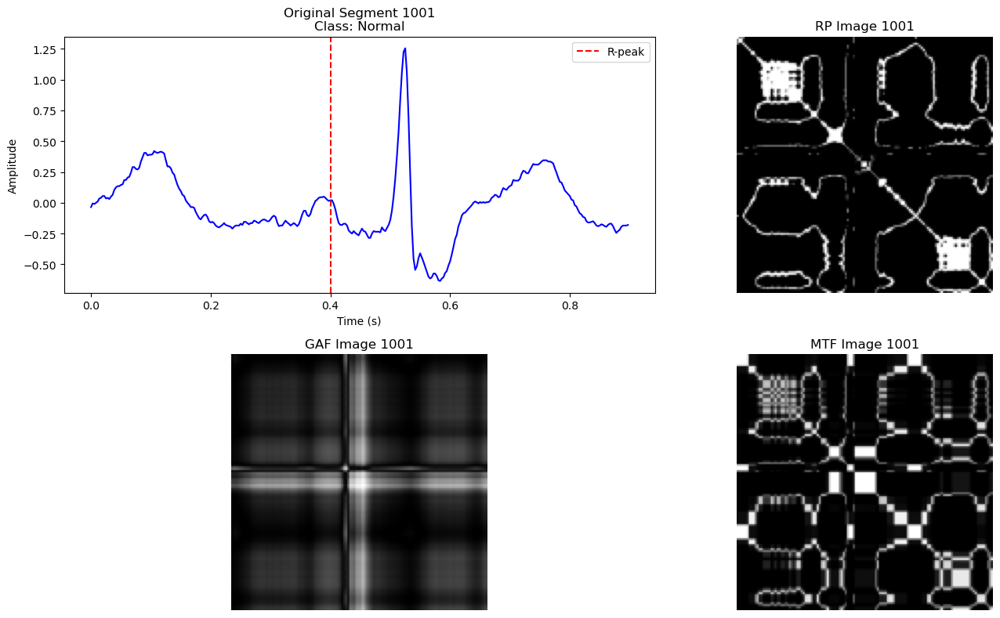

In [41]:
#label match visualization to fused images
import os
import numpy as np
import matplotlib.pyplot as plt
import wfdb

# Define paths
data_path = '/home/researchgroup/mahjabeen_workspace/research/CLINet-ECG-Classification-2024/data/mit-bih/mitbih_database/'  # Path to the MIT-BIH database
combined_images_path = './combined_images'
labels_path = './labels'

# Function to load combined images and labels
def load_combined_data(record_name):
    combined_images_file = os.path.join(combined_images_path, f'{record_name}_combined_images.npy')
    labels_file = os.path.join(labels_path, f'{record_name}_labels.npy')
    combined_images = np.load(combined_images_file)
    labels = np.load(labels_file)
    return combined_images, labels

# Function to plot segment and transformed images
def plot_combined_images(record_name, segment_index):
    combined_images, labels = load_combined_data(record_name)
    
    # Load the full ECG signal for context
    record = wfdb.rdrecord(os.path.join(data_path, record_name))
    ecg_signal = record.p_signal[:, 0]  # Assuming the first channel is the desired ECG signal

    # Calculate the start and end of the segment in samples
    heartbeat_length = 324
    segment_start = segment_index * heartbeat_length
    segment_end = segment_start + heartbeat_length

    if segment_end > len(ecg_signal):
        print(f"Segment index {segment_index} exceeds ECG signal length for record {record_name}.")
        return

    # Extract the original ECG segment
    original_segment = ecg_signal[segment_start:segment_end]

    # Extract the combined image and label
    combined_image = combined_images[segment_index]
    label = labels[segment_index]

    # Create a time axis for the ECG segment
    fs = 360  # Sampling rate in Hz
    time_axis = np.arange(len(original_segment)) / fs

    # Plot the ECG segment and combined image
    plt.figure(figsize=(15, 8))

    plt.subplot(2, 2, 1)
    plt.plot(time_axis, original_segment, color='blue')
    plt.axvline(x=(144/fs), color='r', linestyle='--', label='R-peak')
    plt.title(f'Original Segment {segment_index + 1}\nClass: {label}')
    plt.xlabel('Time (s)')
    plt.ylabel('Amplitude')
    plt.legend()

    # Plot the combined image
    plt.subplot(2, 2, 2)
    plt.imshow(combined_image[:, :, 0], cmap='gray')
    plt.title(f'RP Image {segment_index + 1}')
    plt.axis('off')

    plt.subplot(2, 2, 3)
    plt.imshow(combined_image[:, :, 1], cmap='gray')
    plt.title(f'GAF Image {segment_index + 1}')
    plt.axis('off')

    plt.subplot(2, 2, 4)
    plt.imshow(combined_image[:, :, 2], cmap='gray')
    plt.title(f'MTF Image {segment_index + 1}')
    plt.axis('off')

    plt.tight_layout()
    plt.show()

# Example usage
plot_combined_images('212', 1000)  # Change record_name and segment_index as needed


In [22]:
# #updated label saving 
# import os
# import numpy as np
# import wfdb

# # Define paths
# data_path = '/home/researchgroup/mahjabeen_workspace/research/CLINet-ECG-Classification-2024/data/mit-bih/mitbih_database/'  # Path to the MIT-BIH database
# segmented_heartbeats_path = './segmented_heartbeats'
# labels_path = './labels'
# os.makedirs(labels_path, exist_ok=True)

# # Define AAMI class mapping
# aami_mapping = {
#     'N': 'Normal',
#     'L': 'Normal',
#     'R': 'Normal',
#     'e': 'Normal',
#     'j': 'Normal',
#     'A': 'SVEB',
#     'a': 'SVEB',
#     'J': 'SVEB',
#     'S': 'SVEB',
#     'V': 'VEB',
#     'E': 'VEB',
#     'F': 'Fusion',
#     '/': 'Unknown',
#     'f': 'Unknown',
#     'Q': 'Unknown'
# }

# # List of records to process
# record_list = ['100', '101', '102', '103', '104', '105', '106', '107', '108', '109',
#                '111', '112', '113', '114', '115', '116', '117', '118', '119', '121',
#                '122', '123', '124', '200', '201', '202', '203', '205', '207', '208',
#                '209', '210', '212', '213', '214', '215', '217', '219', '220', '221',
#                '222', '223', '228', '230', '231', '232', '233', '234']

# def regenerate_labels(record_name):
#     try:
#         # Load the R-peak annotations
#         annotation = wfdb.rdann(os.path.join(data_path, record_name), 'atr')
#         r_peaks = annotation.sample
#         labels = annotation.symbol
        
#         # Map the MIT-BIH annotations to AAMI classes
#         aami_labels = [aami_mapping.get(label, 'Unknown') for label in labels]
        
#         # Load the segmented heartbeats
#         heartbeats_path = os.path.join(segmented_heartbeats_path, f'{record_name}_heartbeats.npy')
#         heartbeats = np.load(heartbeats_path)
        
#         # Generate labels for each heartbeat segment
#         segment_labels = []
#         for index in range(len(heartbeats)):
#             segment_center = index * 324 + 162
#             closest_r_peak = min(r_peaks, key=lambda x: abs(x - segment_center))
#             closest_index = np.where(r_peaks == closest_r_peak)[0][0]
#             segment_labels.append(aami_labels[closest_index])
        
#         # Save the labels
#         np.save(os.path.join(labels_path, f'{record_name}_labels.npy'), segment_labels)
#         print(f'Saved labels for record {record_name}')
#     except Exception as e:
#         print(f'Error processing record {record_name}: {e}')

# # Process each record
# for record_name in record_list:
#     print(f'Processing record: {record_name}')
#     regenerate_labels(record_name)

# print('Label generation complete!')


Processing record: 100
Saved labels for record 100
Processing record: 101
Saved labels for record 101
Processing record: 102
Saved labels for record 102
Processing record: 103
Saved labels for record 103
Processing record: 104
Saved labels for record 104
Processing record: 105
Saved labels for record 105
Processing record: 106
Saved labels for record 106
Processing record: 107
Saved labels for record 107
Processing record: 108
Saved labels for record 108
Processing record: 109
Saved labels for record 109
Processing record: 111
Saved labels for record 111
Processing record: 112
Saved labels for record 112
Processing record: 113
Saved labels for record 113
Processing record: 114
Saved labels for record 114
Processing record: 115
Saved labels for record 115
Processing record: 116
Saved labels for record 116
Processing record: 117
Saved labels for record 117
Processing record: 118
Saved labels for record 118
Processing record: 119
Saved labels for record 119
Processing record: 121
Saved la

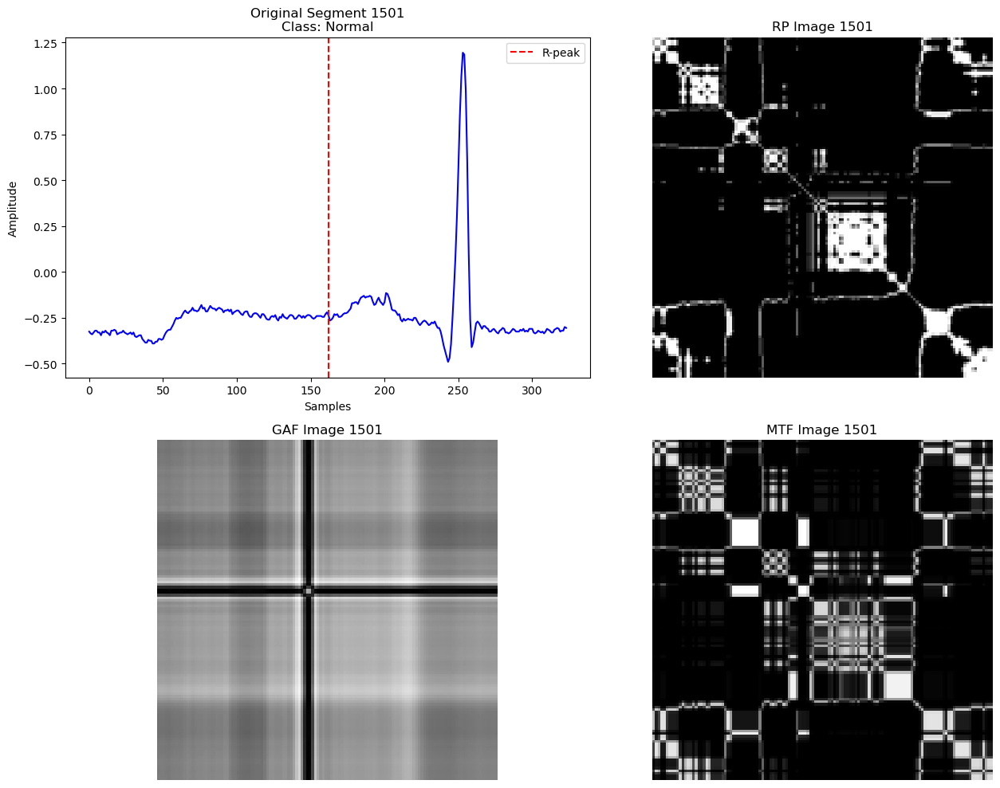

In [33]:
# import os
# import numpy as np
# import matplotlib.pyplot as plt
# import wfdb

# # Define paths
# data_path = '/home/researchgroup/mahjabeen_workspace/research/CLINet-ECG-Classification-2024/data/mit-bih/mitbih_database/'
# segmented_heartbeats_path = './segmented_heartbeats'
# transformed_images_path = './transformed_images'
# labels_dir_path = './labels'  # Renamed to avoid conflict with local variable name

# # Function to load data and annotations
# def load_data(record_name):
#     heartbeats_path = os.path.join(segmented_heartbeats_path, f'{record_name}_heartbeats.npy')
#     rp_images_path = os.path.join(transformed_images_path, 'rp', f'{record_name}_rp_images.npy')
#     gaf_images_path = os.path.join(transformed_images_path, 'gaf', f'{record_name}_gaf_images.npy')
#     mtf_images_path = os.path.join(transformed_images_path, 'mtf', f'{record_name}_mtf_images.npy')
#     labels_path = os.path.join(labels_dir_path, f'{record_name}_labels.npy')  # Use the new variable name here

#     heartbeats = np.load(heartbeats_path)
#     rp_images = np.load(rp_images_path)
#     gaf_images = np.load(gaf_images_path)
#     mtf_images = np.load(mtf_images_path)
#     labels = np.load(labels_path)

#     return heartbeats, rp_images, gaf_images, mtf_images, labels

# # Function to plot and compare
# def plot_segment_and_transforms(record_name, segment_index):
#     heartbeats, rp_images, gaf_images, mtf_images, labels = load_data(record_name)

#     # Load the full ECG signal for context
#     record = wfdb.rdrecord(os.path.join(data_path, record_name))
#     signal = record.p_signal[:, 0]  # Assuming single lead ECG

#     segment = heartbeats[segment_index]
#     rp_image = rp_images[segment_index]
#     gaf_image = gaf_images[segment_index]
#     mtf_image = mtf_images[segment_index]
#     label = labels[segment_index]

#     # Calculate segment start and end
#     segment_start = segment_index * 324
#     segment_center = segment_start + 162  # R-peak should be at the center

#     # Plot original signal segment with R-peak
#     plt.figure(figsize=(20, 10))
#     plt.subplot(2, 3, 1)
#     plt.plot(signal[segment_start:segment_start + 324], color='blue')
#     plt.axvline(x=162, color='red', linestyle='--', label='R-peak')
#     plt.title(f'Original Segment {segment_index+1}\nClass: {label}')
#     plt.xlabel('Samples')
#     plt.ylabel('Amplitude')
#     plt.legend()

#     # Plot RP image
#     plt.subplot(2, 3, 2)
#     plt.imshow(rp_image, cmap='gray')
#     plt.title(f'RP Image {segment_index+1}')
#     plt.axis('off')

#     # Plot GAF image
#     plt.subplot(2, 3, 4)
#     plt.imshow(gaf_image, cmap='gray')
#     plt.title(f'GAF Image {segment_index+1}')
#     plt.axis('off')

#     # Plot MTF image
#     plt.subplot(2, 3, 5)
#     plt.imshow(mtf_image, cmap='gray')
#     plt.title(f'MTF Image {segment_index+1}')
#     plt.axis('off')

#     # Display the plots
#     plt.tight_layout()
#     plt.show()

# # Example usage
# plot_segment_and_transforms('100', 1500)  # Change record_name and segment_index as needed


In [16]:
import os
import numpy as np

# Define paths
segmented_heartbeats_path = './segmented_heartbeats'

# Example record
record_name = '100'  # Change as needed

# Path to the heartbeat segments file for the record
heartbeats_path = os.path.join(segmented_heartbeats_path, f'{record_name}_heartbeats.npy')

# Load the heartbeat segments
heartbeats = np.load(heartbeats_path)

# Print the total number of segments
num_segments = heartbeats.shape[0]
print(f'Total number of segments for record {record_name}: {num_segments}')

# Now you can use indices from 0 to num_segments - 1


Total number of segments for record 100: 2271


In [21]:
import os
import numpy as np
import matplotlib.pyplot as plt
import wfdb

# Define paths
data_path = '/home/researchgroup/mahjabeen_workspace/research/CLINet-ECG-Classification-2024/data/mit-bih/mitbih_database/'
segmented_heartbeats_path = './segmented_heartbeats'
transformed_images_path = './transformed_images'
labels_dir_path = './labels'  # Renamed to avoid conflict with local variable name

# Define the record and load the data
record_name = '100'  # Example record, change as needed
heartbeats_path = os.path.join(segmented_heartbeats_path, f'{record_name}_heartbeats.npy')
rp_images_path = os.path.join(transformed_images_path, 'rp', f'{record_name}_rp_images.npy')
gaf_images_path = os.path.join(transformed_images_path, 'gaf', f'{record_name}_gaf_images.npy')
mtf_images_path = os.path.join(transformed_images_path, 'mtf', f'{record_name}_mtf_images.npy')
labels_path = os.path.join(labels_dir_path,  f'{record_name}_labels.npy')

# Load the segmented heartbeats
heartbeats = np.load(heartbeats_path)
rp_images = np.load(rp_images_path)
gaf_images = np.load(gaf_images_path)
mtf_images = np.load(mtf_images_path)
labels = np.load(labels_path)

# Check if the data lengths match
num_segments = len(heartbeats)
num_rp_images = len(rp_images)
num_gaf_images = len(gaf_images)
num_mtf_images = len(mtf_images)
num_labels = len(labels)

print(f'Number of segments: {num_segments}')
print(f'Number of RP images: {num_rp_images}')
print(f'Number of GAF images: {num_gaf_images}')
print(f'Number of MTF images: {num_mtf_images}')
print(f'Number of labels: {num_labels}')

if not (num_segments == num_rp_images == num_gaf_images == num_mtf_images == num_labels):
    print("Mismatch in the number of segments, images, or labels. Please check the data.")
    raise ValueError("Data length mismatch")

# Function to plot segment and transformed images
def plot_segment_and_transforms(record_name, segment_index):
    if segment_index >= num_segments:
        print(f"Index {segment_index} out of range. Maximum index is {num_segments - 1}.")
        return
    
    heartbeat_segment = heartbeats[segment_index]
    rp_image = rp_images[segment_index]
    gaf_image = gaf_images[segment_index]
    mtf_image = mtf_images[segment_index]
    label = labels[segment_index]

    # Load the full ECG signal for context
    record = wfdb.rdrecord(os.path.join(data_path, record_name))

    # Calculate segment start and end
    segment_start = segment_index * 324
    segment_end = segment_start + 324

    # Plot the segment and transformed images
    plt.figure(figsize=(15, 8))

    # Plot the original segment
    plt.subplot(2, 2, 1)
    plt.plot(heartbeat_segment, color='blue')
    plt.axvline(x=144, color='red', linestyle='--', label='R-peak')
    plt.title(f'Original Segment {segment_index}\nClass: {label}')
    plt.xlabel('Samples')
    plt.ylabel('Amplitude')
    plt.legend()

    # Plot RP image
    plt.subplot(2, 2, 2)
    plt.imshow(rp_image, cmap='gray')
    plt.title(f'RP Image {segment_index}')
    plt.axis('off')

    # Plot GAF image
    plt.subplot(2, 2, 3)
    plt.imshow(gaf_image, cmap='gray')
    plt.title(f'GAF Image {segment_index}')
    plt.axis('off')

    # Plot MTF image
    plt.subplot(2, 2, 4)
    plt.imshow(mtf_image, cmap='gray')
    plt.title(f'MTF Image {segment_index}')
    plt.axis('off')

    plt.tight_layout()
    plt.show()

# Example usage
plot_segment_and_transforms('100', 4)  # Change record_name and segment_index as needed


Number of segments: 2271
Number of RP images: 2271
Number of GAF images: 2271
Number of MTF images: 2271
Number of labels: 7
Mismatch in the number of segments, images, or labels. Please check the data.


ValueError: Data length mismatch